<font size="5">**SANTANDER CUSTOMER TRANSACTION PREDICTION**</font>

<font size="4">**Buisness Problem :-**
The problem is posed by Santander group, a financial services company looking for ways to help clients understand their financial health and identify which products and services might help them achieve their monetary goals. The transaction made by a customer is purely on one’s instinct and intuition, here the group is seeking Machine learning solution to help them identify which customer will make a specific transaction in the future, irrespective of the amount of money transacted. This is all to achieve the overall customer satisfaction.

The historical data related to past activity of the consumer can be used for predictive modeling that captures attributes to which may have great influence on future customer activity. This opens up the way for marketing department to come up with new strategies and optimized marketing campaigns, suited to customer needs which in turn enhances their experience. This significantly reduces the customer attrition rate and increases the customer life time value(LTV).</font>


**PERFORMANCE MATRIX**--
1)This is a binary classification problem having classes 0 and 1. we want to focus more on the minority class,
which is class 1. 
In case of class imbalance (which is this case) the ROC-AUC can be misleading because it looks at both 
the classes whereas the precision-Recall curve focuses only on the minority class. 
That's why Precisin-Recall curve and area under it will be  good fit here.

2) we can use Macro-averaged precison which treats all classes equally(we have class imbalance) instead of looking at only majority class. In case 
of micro average, it takes all class's contribution into account i.e. even if our classifier have high truepoisitve(TP) 
for majority class and low TP for minority class i.e. our model mainly predicting for majority class still the micro average 
will be high.This is like accuracy (we look at all the classes contribution at the same time).our main focus is minority 
class so we have to take macro-averaged precision.

In [32]:
#Importing important libraries
import numpy as np
import pandas as pd
import lightgbm as lgb
from scipy.special import logit
from sklearn.metrics import roc_auc_score,roc_curve, precision_recall_curve, auc,PrecisionRecallDisplay
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore") 

In [18]:
#reading train and test files from system
train_df=pd.read_csv('/content/drive/MyDrive/santander/train.csv')
test_df=pd.read_csv('/content/drive/MyDrive/santander/test.csv')

In [19]:
x_train=train_df.drop(['ID_code','target'],axis=1)
y_train=train_df['target']
print(y_train.value_counts())
x_test=test_df.drop(['ID_code'],axis=1)

0    179902
1     20098
Name: target, dtype: int64


In [ ]:
train_df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,...,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,...,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,...,29.4846,5.8683,3.8208,15.8348,-5.0121,15.1345,3.2003,9.3192,3.8821,5.7999,5.5378,5.0988,22.0330,5.5134,30.2645,10.4968,-7.2352,16.5721,-7.3477,11.0752,-5.5937,9.4878,-14.9100,9.4245,22.5441,-4.8622,7.6543,-15.9319,13.3175,-0.3566,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,-0.3249,-11.2648,14.1929,7.3124,7.5244,14.6472,7.6782,-1.7395,4.7011,20.4775,17.7559,18.1377,1.2145,3.5137,5.6777,13.2177,-7.9940,-2.9029,5.8463,6.1439,-11.1025,12.4858,-2.2871,19.0422,11.0449,4.1087,4.6974,6.9346,...,13.2070,5.8442,4.7086,5.7141,-1.0410,20.5092,3.2790,-5.5952,7.3176,5.7690,-7.0927,-3.9116,7.2569,-5.8234,25.6820,10.9202,-0.3104,8.8438,-9.7009,2.4013,-4.2935,9.3908,-13.2648,3.1545,23.0866,-5.3000,5.3745,-6.2660,10.1934,-0.8417,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,2.3061,2.8102,13.8463,11.9704,6.4569,14.8372,10.7430,-0.4299,15.9426,13.7257,20.3010,12.5579,6.8202,2.7229,12.1354,13.7367,0.8135,-0.9059,5.9070,2.8407,-15.2398,10.4407,-2.5731,6.1796,10.6093,-5.9158,8.1723,2.8521,...,31.8833,5.9684,7.2084,3.8899,-11.0882,17.2502,2.5881,-2.7018,0.5641,5.3430,-7.1541,-6.1920,18.2366,11.7134,14.7483,8.1013,11.8771,13.9552,-10.4701,5.6961,-3.7546,8.4117,1.8986,7.2601,-0.4639,-0.0498,7.9336,-12.8279,12.4124,1.8489,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,-9.4458,-12.1419,13.8481,7.8895,7.7894,15.0553,8.4871,-3.0680,6.5263,11.3152,21.4246,18.9608,10.1102,2.7142,14.2080,13.5433,3.1736,-3.3423,5.9015,7.9352,-3.1582,9.4668,-0.0083,19.3239,12.4057,0.6329,2.7922,5.8184,...,33.5107,5.6953,5.4663,18.2201,6.5769,21.2607,3.2304,-1.7759,3.1283,5.5518,1.4493,-2.6627,19.8056,2.3705,18.4685,16.3309,-3.3456,13.5261,1.7189,5.1743,-7.6938,9.7685,4.8910,12.2198,11.8503,-7.8931,6.4209,5.9270,16.0201,-0.2829,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [5]:
features =np.array( [x for x in train_df.drop(labels=['ID_code','target'],axis=1).columns] )  #inserting all the column names into features except ID_code and target
print('Total number of features without target and ID= ',len(features))
print('train set has shape= ',train_df.shape)
print('test set has shape= ',test_df.shape)

Total number of features without target and ID=  200
train set has shape=  (200000, 202)
test set has shape=  (200000, 201)


<font size="3">So both train and test set have equal number of data-points.</font>

In [ ]:
#check for any missing values in the dataset
print("The number of missing values in train set = ",train_df.isnull().sum().sum())
print("The number of missing values in test set = ",test_df.isnull().sum().sum())

The number of missing values in train set =  0
The number of missing values in test set =  0


Percentage with target value=1 is 10.049% 


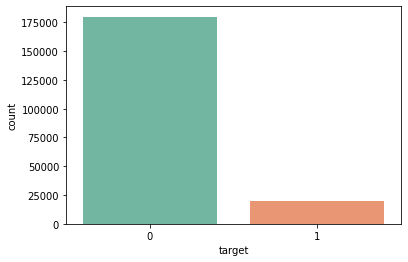

In [ ]:
#checking the distribution of our target 
#train_df['target'].value_counts() basically counts the number of 1 and 1 occurances respectively
sns.countplot(x='target',palette='Set2',data=train_df)
print('Percentage with target value=1 is {}% '.format((train_df['target'].value_counts()[1]/train_df['target'].count()*100)))

In [ ]:
train_df.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,...,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,7.567236,0.394340,-3.245596,14.023978,8.530232,7.537606,14.573126,9.333264,-5.696731,15.244013,12.438567,13.290894,17.257883,4.305430,3.019540,10.584400,13.667496,-4.055133,-1.137908,5.532980,5.053874,-7.687740,10.393046,-0.512886,14.774147,11.434250,3.842499,2.187230,5.868899,10.642131,...,24.259300,5.633293,5.362896,11.002170,-2.871906,19.315753,2.963335,-4.151155,4.937124,5.636008,-0.004962,-0.831777,19.817094,-0.677967,20.210677,11.640613,-2.799585,11.882933,-1.014064,2.591444,-2.741666,10.085518,0.719109,8.769088,12.756676,-3.983261,8.970274,-10.335043,15.377174,0.746072,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,1.235070,5.500793,5.970253,0.190059,4.639536,2.247908,0.411711,2.557421,6.712612,7.851370,7.996694,5.876254,8.196564,2.847958,0.526893,3.777245,0.285535,5.922210,1.523714,0.783367,2.615942,7.965198,2.159891,2.587830,4.322325,0.541614,5.179559,3.119978,2.249730,4.278903,...,10.880263,0.217938,1.419612,5.262056,5.457784,5.024182,0.369684,7.798020,3.105986,0.369437,4.424621,5.378008,8.674171,5.966674,7.136427,2.892167,7.513939,2.628895,8.579810,2.798956,5.261243,1.371862,8.963434,4.474924,9.318280,4.725167,3.189759,11.574708,3.944604,0.976348,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,3.970500,-20.731300,-26.095000,13.434600,-6.011100,1.013300,13.076900,0.635100,-33.380200,-10.664200,-12.402500,-5.432200,-10.089000,-5.322500,1.209800,-0.678400,12.720000,-24.243100,-6.166800,2.089600,-4.787200,-34.798400,2.140600,-8.986100,1.508500,9.816900,-16.513600,-8.095100,-1.183400,-6.337100,...,-7.452200,4.852600,0.623100,-6.531700,-19.997700,3.816700,1.851200,-35.969500,-5.250200,4.258800,-14.506000,-22.479300,-11.453300,-22.748700,-2.995300,3.241500,-29.116500,4.952100,-29.273400,-7.856100,-22.037400,5.416500,-26.001100,-4.808200,-18.489700,-22.583300,-3.022300,-47.753600,4.412300,-2.554300,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.26

In [ ]:
test_df.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,...,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.00000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,0.371335,-3.268551,14.022662,8.540872,7.532703,14.573704,9.321669,-5.70445,15.265776,12.456675,13.298428,17.230598,4.299010,3.019707,10.567479,13.666970,-3.983721,-1.129536,5.530656,5.047247,-7.687695,10.404920,-0.524830,14.762686,11.434861,3.870130,2.213288,5.875048,10.647806,0.672667,...,24.146181,5.635300,5.360975,11.026376,-2.857328,19.320760,2.962821,-4.189133,4.930356,5.633716,-0.020824,-0.805148,19.779528,-0.666240,20.264135,11.635715,-2.776134,11.864538,-0.949318,2.582604,-2.722636,10.080827,0.651432,8.768929,12.719302,-3.963045,8.978800,-10.291919,15.366094,0.755673,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,5.508661,5.961443,0.190071,4.628712,2.255257,0.411592,2.544860,6.74646,7.846983,7.989812,5.884245,8.199877,2.844023,0.527951,3.771047,0.285454,5.945853,1.524765,0.785618,2.610078,7.971581,2.156324,2.588700,4.325727,0.541040,5.170614,3.120685,2.257235,4.260820,4.078592,...,10.876184,0.217936,1.426064,5.268894,5.457937,5.039303,0.370668,7.827428,3.086443,0.365750,4.417876,5.378492,8.678024,5.987419,7.141816,2.884821,7.557001,2.626556,8.570314,2.803890,5.225554,1.369546,8.961936,4.464461,9.316889,4.724641,3.206635,11.562352,3.929227,0.976123,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,-22.672400,-25.811800,13.424500,-4.741300,0.670300,13.203400,0.314300,-28.90690,-11.324200,-12.699400,-2.634600,-9.940600,-5.164000,1.390600,-0.731300,12.749600,-24.536100,-6.040900,2.842500,-4.421500,-34.054800,1.309200,-8.209000,1.691100,9.776400,-16.923800,-10.466800,-0.885100,-5.368300,-14.083700,...,-8.925700,4.910600,0.106200,-6.093700,-21.514000,3.667300,1.813100,-37.176400,-5.405700,4.291500,-15.593200,-20.393600,-11.796600,-21.342800,-2.485400,2.951200,-29.838400,5.025300,-29.118500,-7.767400,-20.610600,5.346000,-28.092800,-5.476800,-17.011400,-22.467000,-2.303800,-47.306400,4.429100,-2.511500,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.91190

Standard Deviation and Mean values have large range for train and test dataset.

In [ ]:
data_correlation=train_df.drop(['ID_code','target'],axis=1).corr()

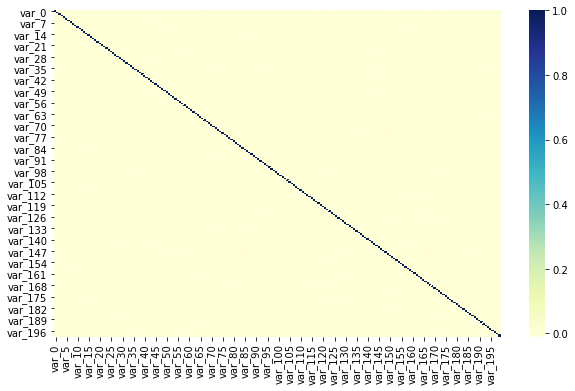

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
sns.heatmap(data_correlation,cmap="YlGnBu")

It seems as there is very little co-relation between features (almost 0).So we have no highly co-related features which we could drop.
Let's check how much variance is explained with respect to number of features using PCA.

In [ ]:
#Standardizing the x_train data for PCA
standardized_data= StandardScaler().fit_transform(x_train)

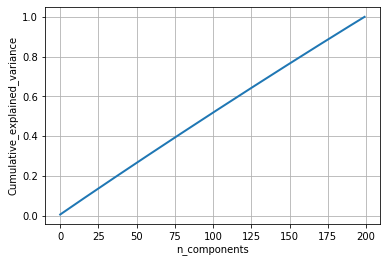

In [ ]:
#plot for number of components vs cumulative variance explained using PCA.
pca=PCA()
pca.n_components = 200
pca_data = pca.fit_transform(standardized_data)

percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);

cum_var_explained = np.cumsum(percentage_var_explained)

plt.figure(1, figsize=(6, 4))

plt.clf()
plt.plot(cum_var_explained, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('n_components')
plt.ylabel('Cumulative_explained_variance')
plt.show()

The plot comes out to be straight line between number of components and cumulative variance explained. 
<br>Even 90% of variance is explained in more than 180 features and 100% variance is explained by all of the 200 features.
so we have to take all the features into consideration.

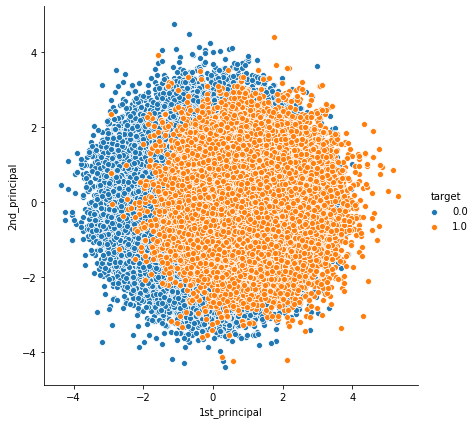

In [ ]:
#plotting the visualization of the data using dimensionality reduction technique of PCA.
pca.n_components = 2
pca_data = pca.fit_transform(standardized_data)

pca_data = np.vstack((pca_data.T,y_train)).T

# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "target"))
sns.FacetGrid(pca_df, hue="target", height=6).map(sns.scatterplot, '1st_principal', '2nd_principal').add_legend()
plt.show()

From the above figure we can say that this data is not linearly seperable. The positive classes are clustered more towards right than the negative class, however still the overlap is quite high.

In [ ]:
#creating a dataset with equal number of instances from both classes, as tsne takes a lot of time for 200k points.
#we have 20098 instances of target=1, so we are taking equal number of target=0 to make it a balanced dataset.
df= train_df.sample(frac=1)  #shuffle the dataframe w.r.t rows
tar_0 = df.loc[train_df['target'] == 0][:20098] 
tar_1 = df.loc[train_df['target'] == 1]
new= pd.concat([tar_0,tar_1])
new= new.sample(frac=1,random_state=0)

x=new.drop(['ID_code','target'],axis=1)
y=new['target']

In [ ]:
model = TSNE(n_components=2, random_state=42, perplexity=50,n_iter=400,n_jobs=-1)
tsne_data = model.fit_transform(x)

tsne_data = np.vstack((tsne_data.T, y)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("feature_1", "feature_2", "target"))

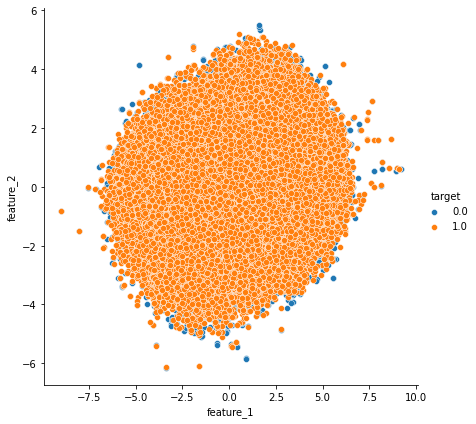

In [ ]:
sns.FacetGrid(tsne_df, hue="target", size=6).map(sns.scatterplot, 'feature_1','feature_2').add_legend()
plt.show()

Tsne is a non-linear dimensionality reduction technique.
just like PCA, Tsne also shows that our data set is not linearly seperable and linear models might not work well for this data set.

As we have to use all of the features lets have a look at their distribution with respect to targets.

In [ ]:
#splitting data with respect to target for plotting
data_0 = train_df.loc[train_df['target'] == 0]
data_1 = train_df.loc[train_df['target'] == 1]

In [ ]:
data_0.shape

(179902, 202)

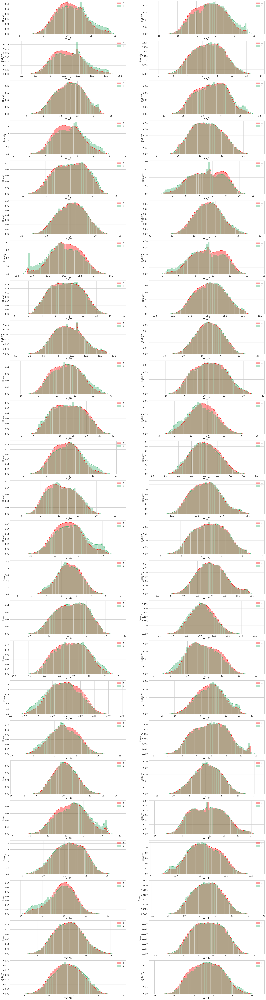

In [ ]:
#Plotting the distribution of all the features (variables) w.r.t to target 
#plotting for first 50 variables
plt.style.use('seaborn')
sns.set(font_scale=2)
plt.figure(figsize=(50,200))
sns.set_style(style='whitegrid')
for i,feature in enumerate(features[:50]):
    plt.subplot(25,2,i+1)
    sns.distplot(data_0[feature],label='0',color='Red',norm_hist=True)
    sns.distplot(data_1[feature],label='1',color='Mediumseagreen',norm_hist=True)
    plt.legend()  
plt.show()    

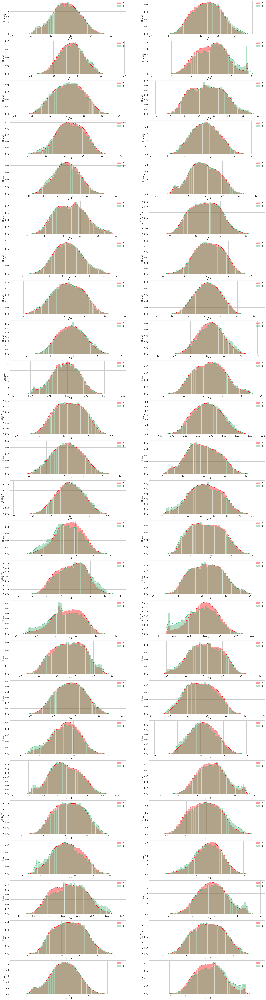

In [ ]:
#plotting for next 50
plt.figure(figsize=(50,200))
sns.set_style(style='whitegrid')
for i,feature in enumerate(features[50:100]):
    plt.subplot(25,2,i+1)
    sns.distplot(data_0[feature],label='0',color='Red',norm_hist=True)
    sns.distplot(data_1[feature],label='1',color='Mediumseagreen',norm_hist=True)
    plt.legend()  
plt.show()    

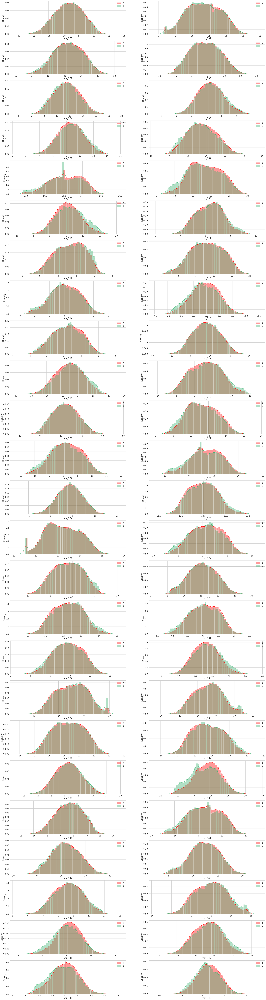

In [ ]:
plt.figure(figsize=(50,200))
sns.set_style(style='whitegrid')
for i,feature in enumerate(features[100:150]):
    plt.subplot(25,2,i+1)
    sns.distplot(data_0[feature],label='0',color='Red',norm_hist=True)
    sns.distplot(data_1[feature],label='1',color='Mediumseagreen',norm_hist=True)
    plt.legend()  
plt.show()    

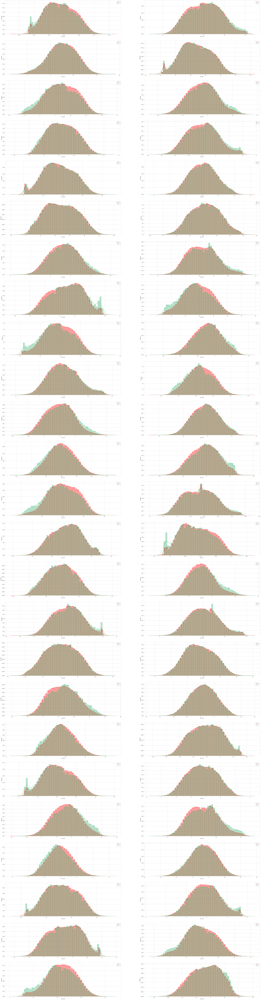

In [ ]:
plt.figure(figsize=(50,200))
sns.set_style(style='whitegrid')
for i,feature in enumerate(features[150:200]):
    plt.subplot(25,2,i+1)
    sns.distplot(data_0[feature],label='0',color='Red',norm_hist=True)
    sns.distplot(data_1[feature],label='1',color='Mediumseagreen',norm_hist=True)  
    plt.legend()
plt.show()    

Here as we can see most of the features are following almost gaussian distribution. Gaussian Naive Bayes should work well here.
<br> Some of the features looks like bimodal distribution. variables-2,9,13,16,41,53,59,60,68,80,81,89,95,99,108,126,134,135,139,145,150,153,158,164,175,177,180,188,191,194,195,196.
<br> There is huge overlap between the distributions.

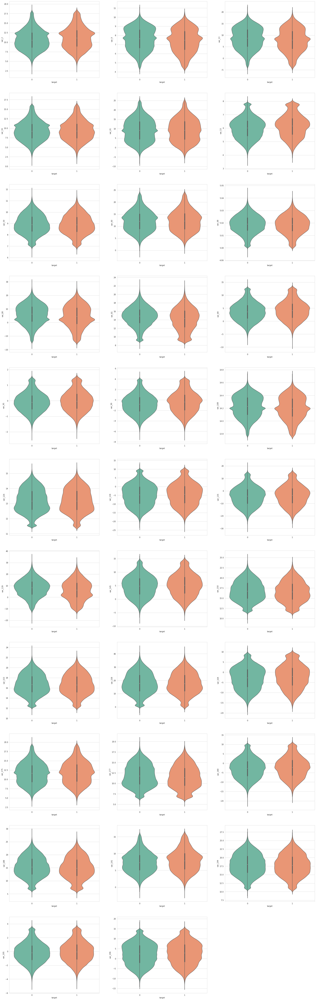

In [ ]:
#Plotting box plot for more information on above bimodal variables.
#https://seaborn.pydata.org/generated/seaborn.boxplot.html
vars=['var_2','var_9','var_13','var_16','var_41','var_53','var_59','var_60','var_68','var_80','var_81','var_89','var_95','var_99','var_108','var_126','var_134','var_135',
      'var_139','var_145','var_150','var_153','var_158','var_164','var_175','var_177','var_180','var_188','var_191','var_194','var_195','var_196']
plt.figure(figsize=(30,100))
sns.set_style(style='whitegrid')
for i,variable in enumerate(vars):
  plt.subplot(11,3,i+1)
  sns.violinplot(x=train_df['target'],y=train_df[variable],palette="Set2")    
plt.show()  

According to the violin plot analysis with respect to target, we found that the plots more or less look same and also there isn't any extreme outliers with these variables. By removing these outliers we may loose important information.
<br> May be there is a chance the outliers are removed while anonymizing the data.

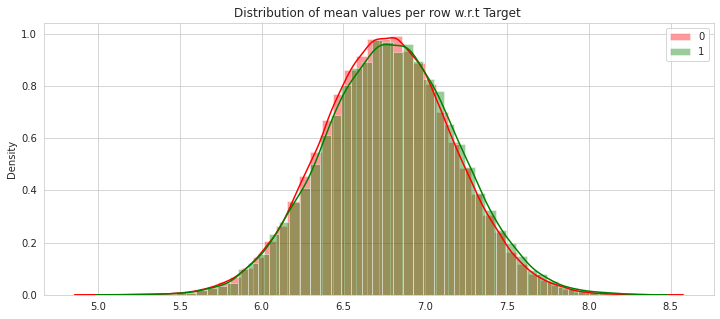

In [ ]:
#Distribution of mean values per row (customer) with respect to target
plt.figure(figsize=(12,5))
sns.set_style(style='whitegrid')
plt.title('Distribution of mean values per row w.r.t Target ')
sns.distplot(data_0.drop(['target','ID_code'],axis=1).mean(axis=1),label='0',color='Red',hist=True)
sns.distplot(data_1.drop(['target','ID_code'],axis=1).mean(axis=1),label='1',color='Green',hist=True)  
plt.legend()
plt.show()   

The mean value per customer distributions looks like a normal distributed curve and the difference in the peak is marginally less for target==1. lets check the curve for the difference in their mean.

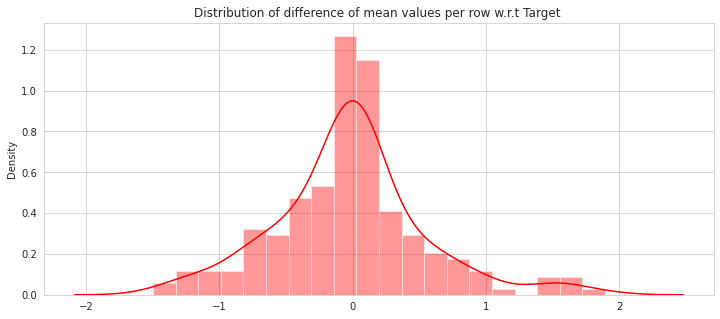

In [ ]:
#https://www.kaggle.com/blackblitz/gaussian-naive-bayes
plt.figure(figsize=(12,5))
sns.set_style(style='whitegrid')
plt.title('Distribution of difference of mean values per row w.r.t Target ')
sns.distplot((data_0.drop(['target','ID_code'],axis=1).mean()-data_1.drop(['target','ID_code'],axis=1).mean()),color='Red',hist=True)
 
plt.show()   

From this figure we can see that the mean difference (target==0 minus target==1) is more or less balanced around zero.

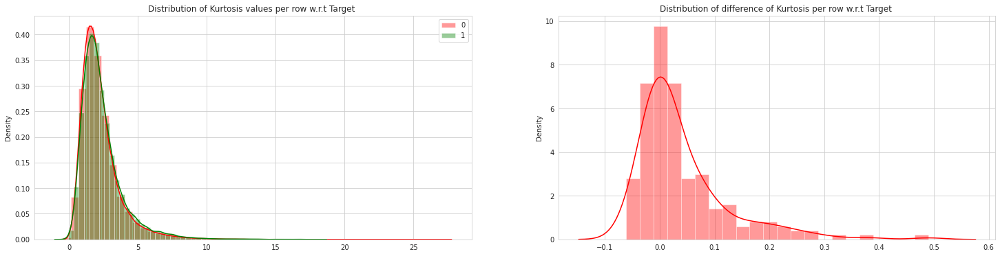

In [ ]:
#plot for distribution of kurtosis w.r.t target.
plt.figure(figsize=(25,6))
plt.subplot(1,2,1)
sns.set_style(style='whitegrid')
plt.title('Distribution of Kurtosis values per row w.r.t Target ')
sns.distplot(data_0.drop(['target','ID_code'],axis=1).kurtosis(axis=1),label='0',color='Red',hist=True)
sns.distplot(data_1.drop(['target','ID_code'],axis=1).kurtosis(axis=1),label='1',color='Green',hist=True)  
plt.legend()

plt.subplot(1,2,2)
sns.set_style(style='whitegrid')
plt.title('Distribution of difference of Kurtosis per row w.r.t Target ')
sns.distplot((data_0.drop(['target','ID_code'],axis=1).kurtosis()-data_1.drop(['target','ID_code'],axis=1).kurtosis()),color='Red',hist=True)
plt.show()   
plt.show()   

kurtosis values for target==1 is slightly less than taget==0. There is a overlap between the two distributions.Kurtosis identifies weather the tails of the distributions contains extreme values and is used as a measure of financial risk(weather there is a probability of extremely large or exteremely samall returns). The difference of kurtosis plot is a right skewed i.e. a lot of differences are actually small but some of the differences are large too. 

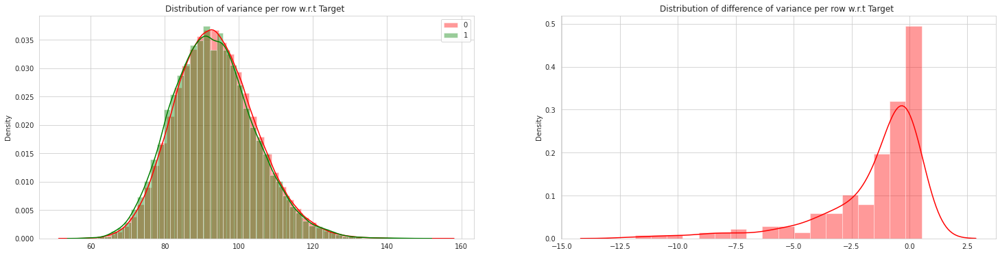

In [ ]:
#https://www.kaggle.com/blackblitz/gaussian-naive-bayes
plt.figure(figsize=(25,6))
plt.subplot(1,2,1)
sns.set_style(style='whitegrid')
plt.title('Distribution of variance per row w.r.t Target ')
sns.distplot(data_0.drop(['target','ID_code'],axis=1).var(axis=1),label='0',color='Red',hist=True)
sns.distplot(data_1.drop(['target','ID_code'],axis=1).var(axis=1),label='1',color='Green',hist=True)  
plt.legend()
plt.subplot(1,2,2)
sns.set_style(style='whitegrid')
plt.title('Distribution of difference of variance per row w.r.t Target ')
sns.distplot((data_0.drop(['target','ID_code'],axis=1).var()-data_1.drop(['target','ID_code'],axis=1).var()),color='Red',hist=True)
plt.show()   

The Distribution of variance with respect to target looks like normally distributed curve.
<br> The distribution of their variance difference curve is a left skewed curve and almost entire curve is pn the negative side. This means the target==0 liklyhood distributions are more concentrated around their mean than the target==1 ones (we are subtracting target=0 - target=1). This difference adds to the discriminating power of models.

In [ ]:
%%time
#lets try to find out the important features by fitting our data to random forest classifier with default parameters.
forest =RandomForestClassifier(class_weight='balanced',n_jobs=-1)
forest.fit(x_train,y_train)
important_fea=forest.feature_importances_

CPU times: user 11min 49s, sys: 305 ms, total: 11min 49s
Wall time: 5min 58s


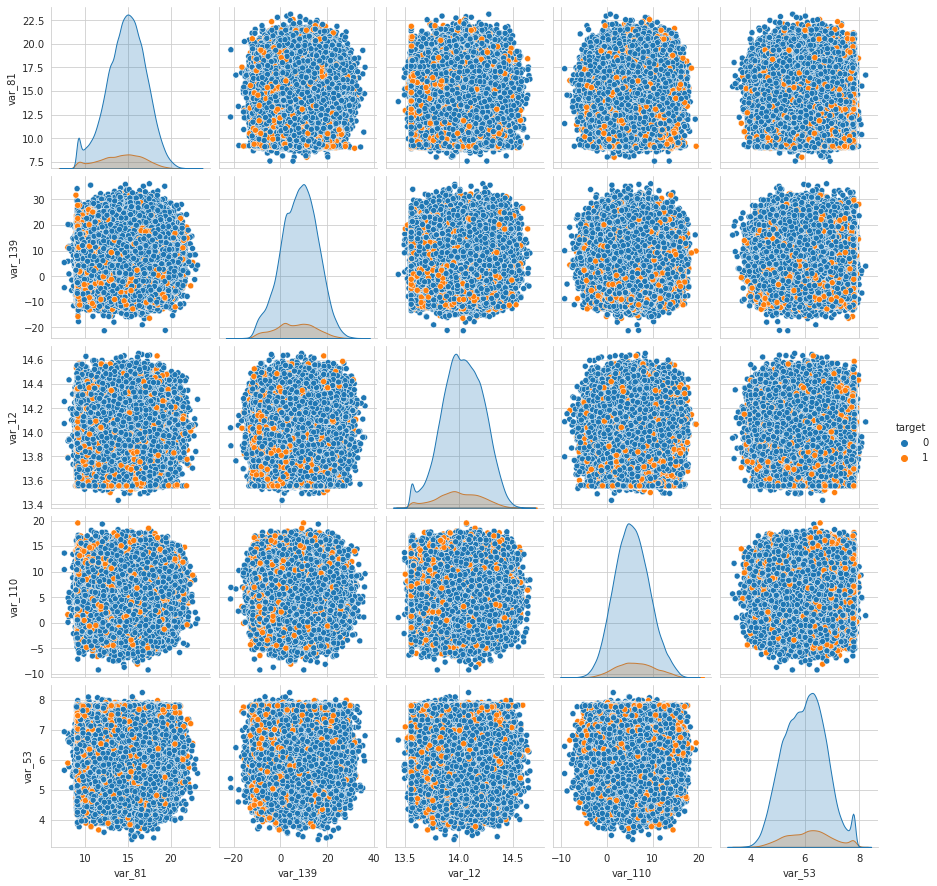

In [ ]:
#Bi-variate analysis between top 5 features.
n_top=5
top_indx= (-important_fea).argsort()[:n_top]
sns.set_style('whitegrid')
sns.pairplot(train_df,hue='target',vars=features[top_indx])
plt.show()

From the above bi-variate analysis of top features we can see that there is a huge overlap between both the targets. It is not easy to seperate the two classes.

In [20]:
#Splitting the train data into 80% for train and 20% for cross-validation.
x_train,x_cv,y_train,y_cv= train_test_split(x_train, y_train, test_size=0.2, random_state=0)
print(x_train.shape,y_train.shape)

(160000, 200) (160000,)


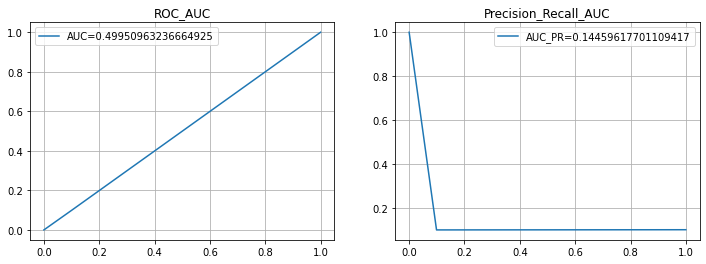

In [37]:
#creating a base line model which just predict 0 or 1 randomly.
from sklearn.dummy import DummyClassifier
dummy=DummyClassifier(strategy='stratified')
dummy.fit(x_train,y_train)
y_pred=dummy.predict_proba(x_train)
fpr,tpr,th=roc_curve(y_train,y_pred[:,1])
precision,recall,threshold=precision_recall_curve(y_train,y_pred[:,1])
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title('ROC_AUC')
plt.plot(fpr,tpr,label='AUC='+str(auc(fpr,tpr)))
plt.grid()
plt.legend()
plt.subplot(1,2,2)
plt.title('Precision_Recall_AUC')
plt.plot(recall,precision,label='AUC_PR='+str(auc(recall,precision)))
plt.grid()
plt.legend()
plt.show()

As expected our ROC_AUC of random model score came out to be 0.499(=0.5) as roc score of a random classifier is 0.5. The precision_Recall curve score is quite low(=0.144). If any of the machine learning model shows scores less than these scores than basically it is predicting worse than a random model.